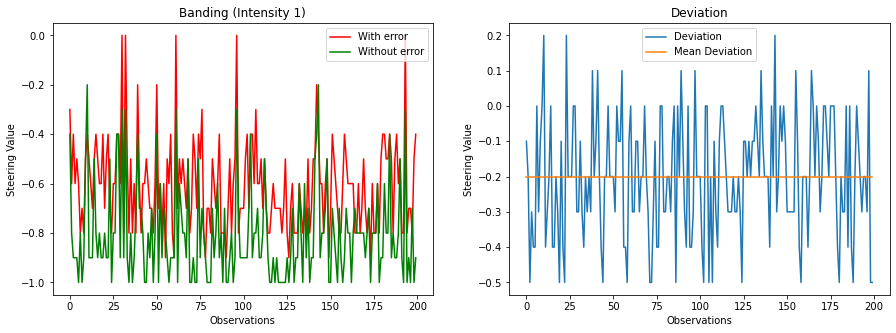

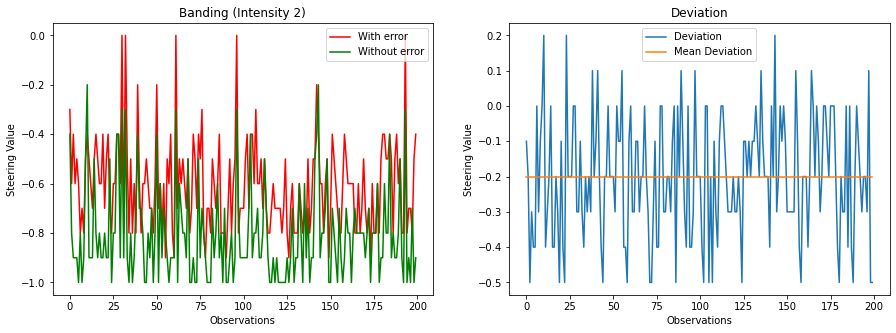

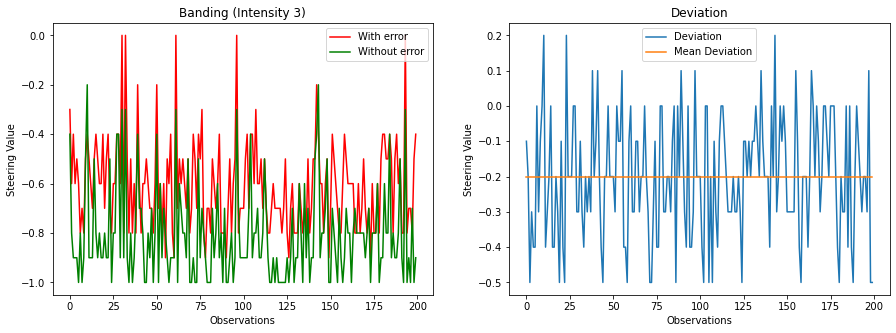

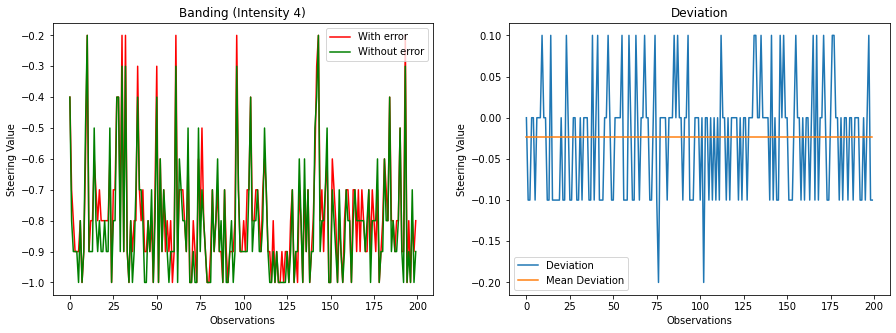

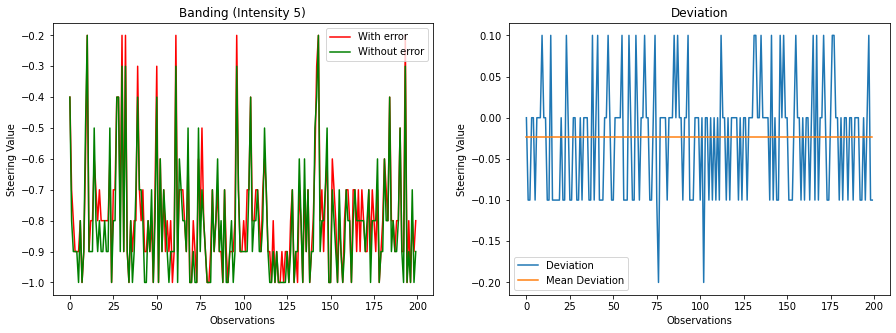

...

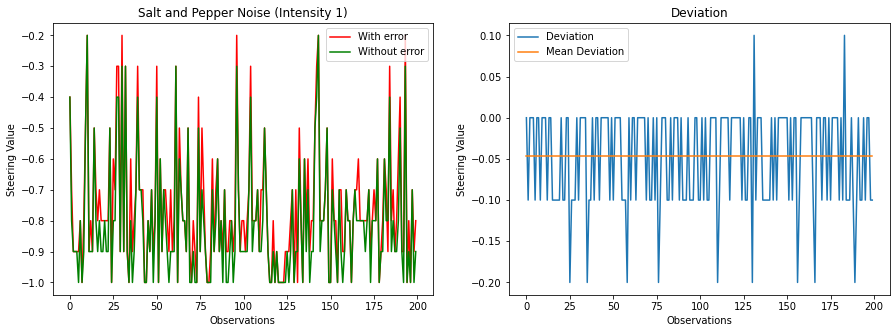

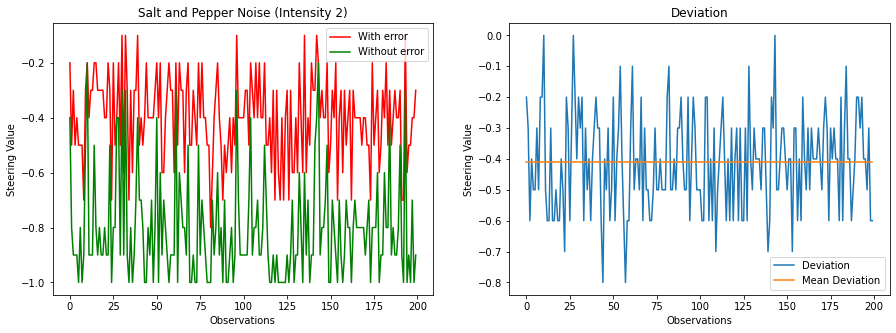

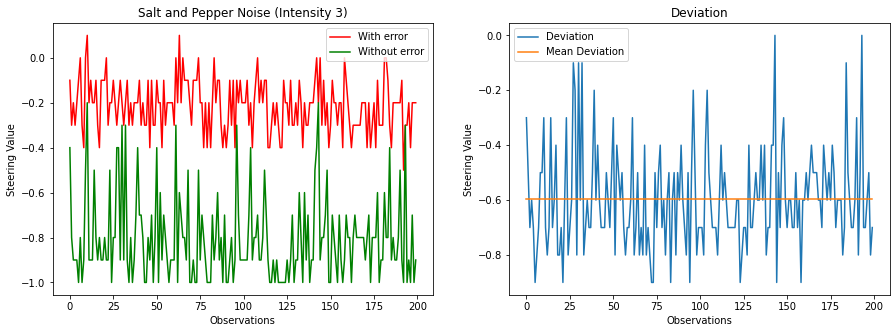

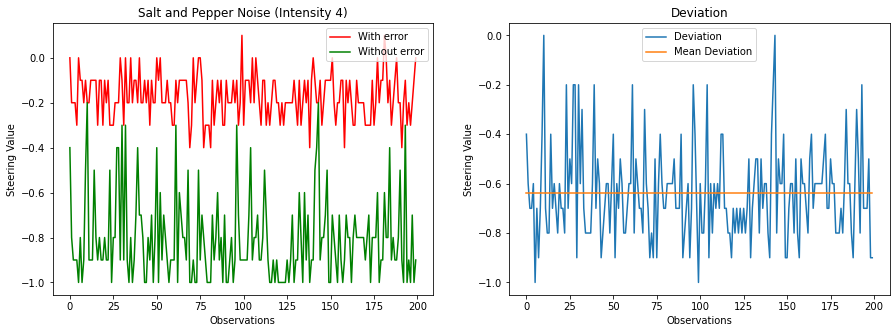

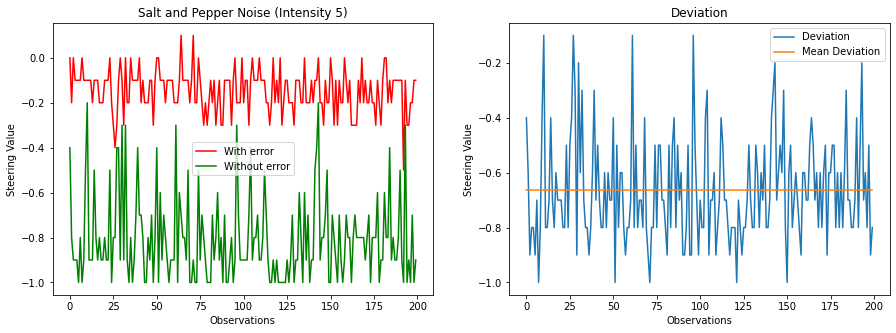

In [3]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

def deviation(error_list,no_error_list):
    array1 = np.array(no_error_list)
    array2 = np.array(error_list)
    subtracted_array = np.subtract(array1, array2)
    subtracted = list(subtracted_array)
    return subtracted

def average(lst):
    aver = sum(lst) / len(lst)
    avg = []
    for i in range(1,201):
        avg.append(aver)
    return aver,avg

def output_plot(num,no_err_list, err_list, dev_list, flag, intensity):
    plt.subplots(figsize=(15, 5))
    avg_val,avg_lst = average(dev_list)

    plt.subplot(1, 2, 1)  
    plt.plot(num, err_list,'r',no_err_list,'g')
    plt.title(flag + ' '+ '(Intensity ' + str(intensity) + ')')
    plt.xlabel('Observations')
    plt.ylabel('Steering Value')
    plt.legend(['With error','Without error'])

    plt.subplot(1, 2, 2) 
    plt.plot(num, dev_list,avg_lst)
    plt.title("Deviation")
    plt.xlabel('Observations')
    plt.ylabel('Steering Value')
    plt.legend(['Deviation','Mean Deviation'])


    plt.show()
    return avg_val
    
csv_paths = []
avg_blur = []
avg_band = []
avg_bright = []
avg_cond = []
avg_crack =[]
avg_dirt =[]
avg_fog =[]
avg_ice = []
avg_rain =[]
avg_sharp = []
avg_blk_img = []
avg_dead_pxl = []
avg_dead_pxl_line = []
avg_bayer = []
avg_chrom = []
avg_demos = []
avg_speckle = []
avg_dev = []

csv_errors = ['banding','Blur','brightness','condensation', 'crack','dirt','fog','ice','rain','Sharpness','blacked_image',
              'Dead_pixel','Dead_pxl_line','No_Bayer_filter','No_Chromatic_Aberration_Correction','No_Demosaicing',
              'Speckle_noise']

csv_path_main = 'D:/Uni-Siegen/4th Sem (SS 2022)/Arbeit/Trust-E/Results/'

for error in csv_errors:
    for strength in range(1,6):
        csv_paths.append(csv_path_main + error + '/' + error + '_strength_' + str(strength) + '_.xlsx')

for path in csv_paths:
    excel_file = pd.ExcelFile(path)
    df = pd.read_excel(excel_file)
    img_no = df['id'].tolist()
    steer_no_error = df['Steering_value'].tolist()
    steer_error = df['Faulty_steering_value'].tolist()
    deviation_steer = deviation(steer_error, steer_no_error)
    average_val,a_x = average(deviation_steer)
    avg_dev.append(average_val)
    
    if 'banding' in path:
        avg_band.append(output_plot(img_no,steer_no_error, steer_error,deviation_steer, 'Banding',path[-7]))
    elif 'Blur' in path:
        avg_blur.append(output_plot(img_no,steer_no_error, steer_error,deviation_steer, 'Blur',path[-7]))
    elif 'brightness' in path:
        avg_bright.append(output_plot(img_no,steer_no_error, steer_error,deviation_steer, 'Brightness',path[-7]))
    elif 'condensation' in path:
        avg_cond.append(output_plot(img_no,steer_no_error, steer_error,deviation_steer, 'Condensation',path[-7]))
    elif 'crack' in path:
        avg_crack.append(output_plot(img_no,steer_no_error, steer_error,deviation_steer, 'Crack',path[-7]))
    elif 'dirt' in path:
        avg_dirt.append(output_plot(img_no,steer_no_error, steer_error,deviation_steer, 'Dirt',path[-7]))
    elif 'fog' in path:
        avg_fog.append(output_plot(img_no,steer_no_error, steer_error,deviation_steer, 'Fog',path[-7]))
    elif 'ice' in path:
        avg_ice.append(output_plot(img_no,steer_no_error, steer_error,deviation_steer, 'Ice',path[-7]))
    elif 'rain' in path:
        avg_rain.append(output_plot(img_no,steer_no_error, steer_error,deviation_steer, 'Rain Drop Blur',path[-7]))
    elif 'Sharpness' in path:
        avg_sharp.append(output_plot(img_no,steer_no_error, steer_error,deviation_steer, 'Sharpness',path[-7]))
    elif 'blacked_image' in path:
        avg_blk_img.append(output_plot(img_no,steer_no_error, steer_error,deviation_steer, 'Blacked Image',path[-7]))
    elif 'Dead_pixel' in path:
        avg_dead_pxl.append(output_plot(img_no,steer_no_error, steer_error,deviation_steer, 'Dead Pixels',path[-7]))
    elif 'Dead_pxl_line' in path:
        avg_dead_pxl_line.append(output_plot(img_no,steer_no_error, steer_error,deviation_steer, 'Dead Pixels Line',path[-7]))
    elif 'No_Bayer_filter' in path:
        avg_bayer.append(output_plot(img_no,steer_no_error, steer_error,deviation_steer, 'No Bayer Filter',path[-7]))
    elif 'No_Chromatic_Aberration_Correction' in path:
        avg_chrom.append(output_plot(img_no,steer_no_error, steer_error,deviation_steer, 'No Chromatic Aberration Correction',path[-7]))
    elif 'No_Demosaicing' in path:
        avg_demos.append(output_plot(img_no,steer_no_error, steer_error,deviation_steer, 'No Demosaicing',path[-7]))
    elif 'Speckle_noise' in path:
        avg_speckle.append(output_plot(img_no,steer_no_error, steer_error,deviation_steer, 'Salt and Pepper Noise',path[-7]))
        
        

In [4]:
from tabulate import tabulate

csv_errors = ['banding','Blur','brightness','condensation', 'crack','dirt','fog','ice','rain','Sharpness','blacked_image',
              'Dead_pixels','Dead_pixels_line','No_Bayer_filter','No_Chromatic_Aberration_Correction','No_Demosaicing',
              'Speckle_noise']
print('\nFinal Conclusion\n\n') 

final_table = []
inten_1 = []
inten_2 = []
inten_3 = []
inten_4 = []
inten_5 = []

iter_list = [0,5,10,15,20,25,30,35,40,45,50,55,60,65,70,75,80]
for i in iter_list:
    inten_1.append(avg_dev[i])
    inten_2.append(avg_dev[i+1])
    inten_3.append(avg_dev[i+2])
    inten_4.append(avg_dev[i+3])
    inten_5.append(avg_dev[i+4])

for i in range(17):
    final_table.append([csv_errors[i],inten_1[i],inten_2[i],inten_3[i],inten_4[i],inten_5[i]])


header = ["Error Type","Intensity 1", "Intensity 2", "Intensity 3", "Intensity 4", "Intensity 5"]
print(tabulate(final_table, header))

 


Final Conclusion


Error Type                            Intensity 1    Intensity 2    Intensity 3    Intensity 4    Intensity 5
----------------------------------  -------------  -------------  -------------  -------------  -------------
banding                                   -0.2015        -0.2015        -0.2015        -0.024         -0.024
Blur                                       0.009         -0.001         -0.026         -0.0725        -0.157
brightness                                 0             -0.1565        -0.5865        -0.722         -0.7765
condensation                              -0.2995        -0.671         -0.671         -0.461         -0.545
crack                                     -0.5525        -0.6555        -0.142         -0.5335        -0.493
dirt                                      -0.0235        -0.0625        -0.0215        -0.089         -0.5475
fog                                       -0.3445        -0.303         -0.1575         0.007          0

In [5]:
#avg_dev_1,avg_dev_2,avg_dev_3,avg_dev_4,avg_dev_5,avg_dev_6,avg_dev_7,avg_dev_8,avg_dev_9,avg_dev_10,avg_dev_11,avg_dev_12,avg_dev_13,avg_dev_14,avg_dev_15,avg_dev_16,avg_dev_17):
def output_dev_plot(num,dev_avgs):
    plt.subplots(figsize=(15, 5))
    #plt.plot(num,avg_dev_1,'o-',avg_dev_2,'o-',avg_dev_3,'o-',avg_dev_4,'o-',avg_dev_5,'o-',avg_dev_6,'o-',avg_dev_7,'o-',avg_dev_8,'o-',avg_dev_9,'o-',avg_dev_10,'o-',avg_dev_11,'o-',avg_dev_12,'o-',avg_dev_13,'o-',avg_dev_14,'o-',avg_dev_15,'o-',avg_dev_16,'o-',avg_dev_17,'o-')
    for i in range(17):
        plt.plot(num,dev_avgs[i],'o-')
    plt.title('Average Devation')
    plt.xlabel('Error Intensity')
    plt.ylabel('Deviation')
    plt.legend(['banding','Blur','brightness','condensation', 'crack','dirt','fog','ice','rain','Sharpness','blacked_image',
              'Dead_pixels','Dead_pixels_line','No_Bayer_filter','No_Chromatic_Aberration_Correction','No_Demosaicing',
              'Speckle_noise'],bbox_to_anchor = (1.3,1.0))
    plt.show()

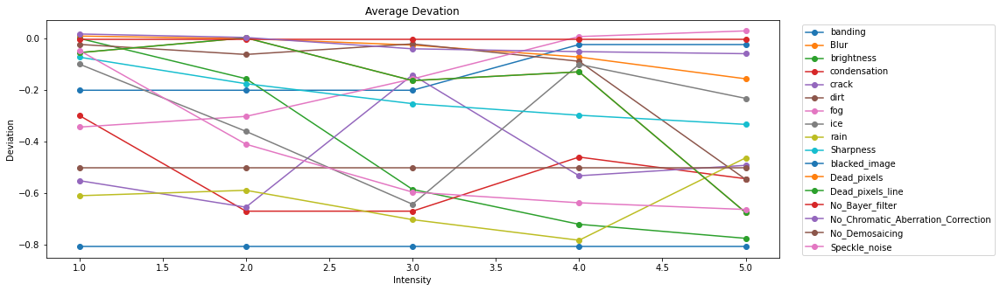

In [166]:
nos = np.linspace(1, 5, 5)
avg_devs = [avg_band,avg_blur,avg_bright,avg_cond,avg_crack,avg_dirt,avg_fog,avg_ice,avg_rain,avg_sharp,avg_blk_img,avg_dead_pxl,avg_dead_pxl_line,avg_bayer,avg_chrom,avg_demos,avg_speckle] 
output_dev_plot(nos,avg_devs)